In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="thG33xUjGSCIzbllIF4X")
project = rf.workspace("objectdetection-dxeuw").project("face-detection-z1x9s")
version = project.version(1)
dataset = version.download("yolov11")
                

In [ ]:
def write_yaml_file(text,file_path):
    with open(file_path,'w') as file:
        file.write(text)

text='''
names: 
- Face
- face

nc: 2

train: /kaggle/working/face-detection-1/train/images
val: /kaggle/working/face-detection-1/test/images
test: /kaggle/working/face-detection-1/test/images

'''        
write_yaml_file(text,"Data.yaml")

In [ ]:
%pip install ultralytics
import ultralytics
ultralytics.checks()

In [11]:
!yolo task= detect mode= train data=/kaggle/working/Data.yaml model=yolo11s.pt epochs=50 imgsz=640 batch=16

Ultralytics 8.3.24 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolo11s.pt, data=/kaggle/working/Data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show

In [12]:
from IPython.display import Image, display

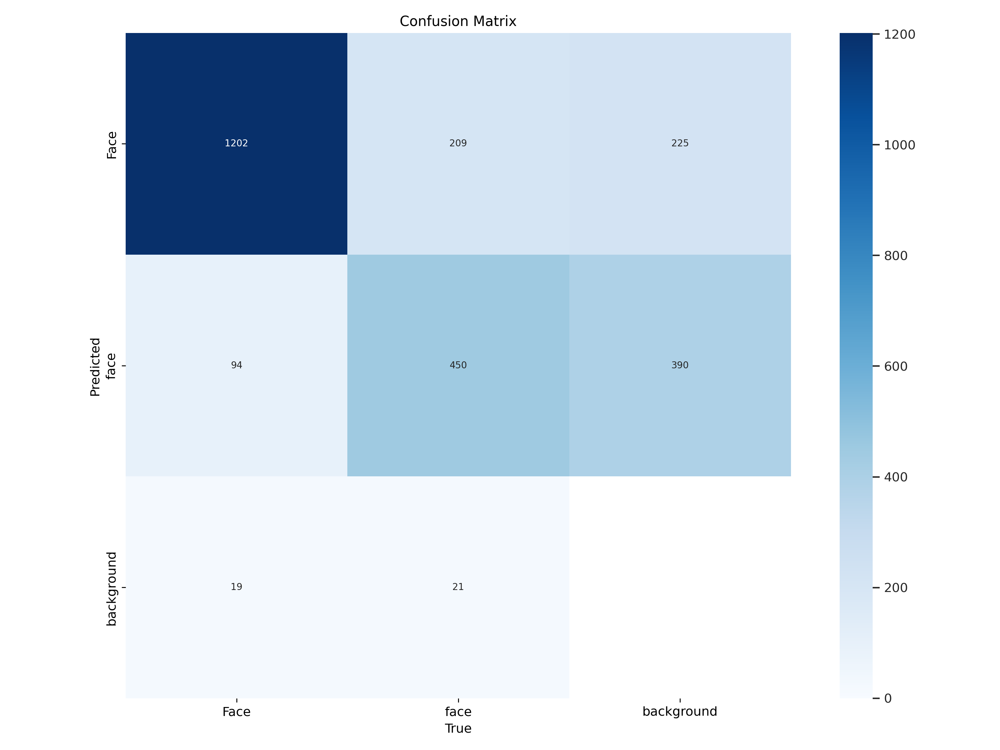

In [13]:
display(Image(filename=f'/kaggle/working/runs/detect/train2/confusion_matrix.png',width=1000))

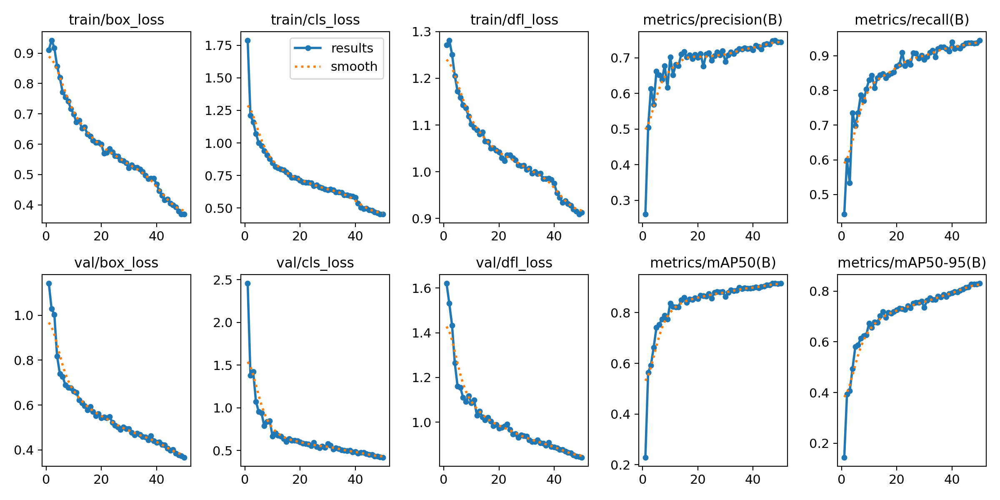

In [14]:
display(Image(filename=f'/kaggle/working/runs/detect/train2/results.png',width=1000))

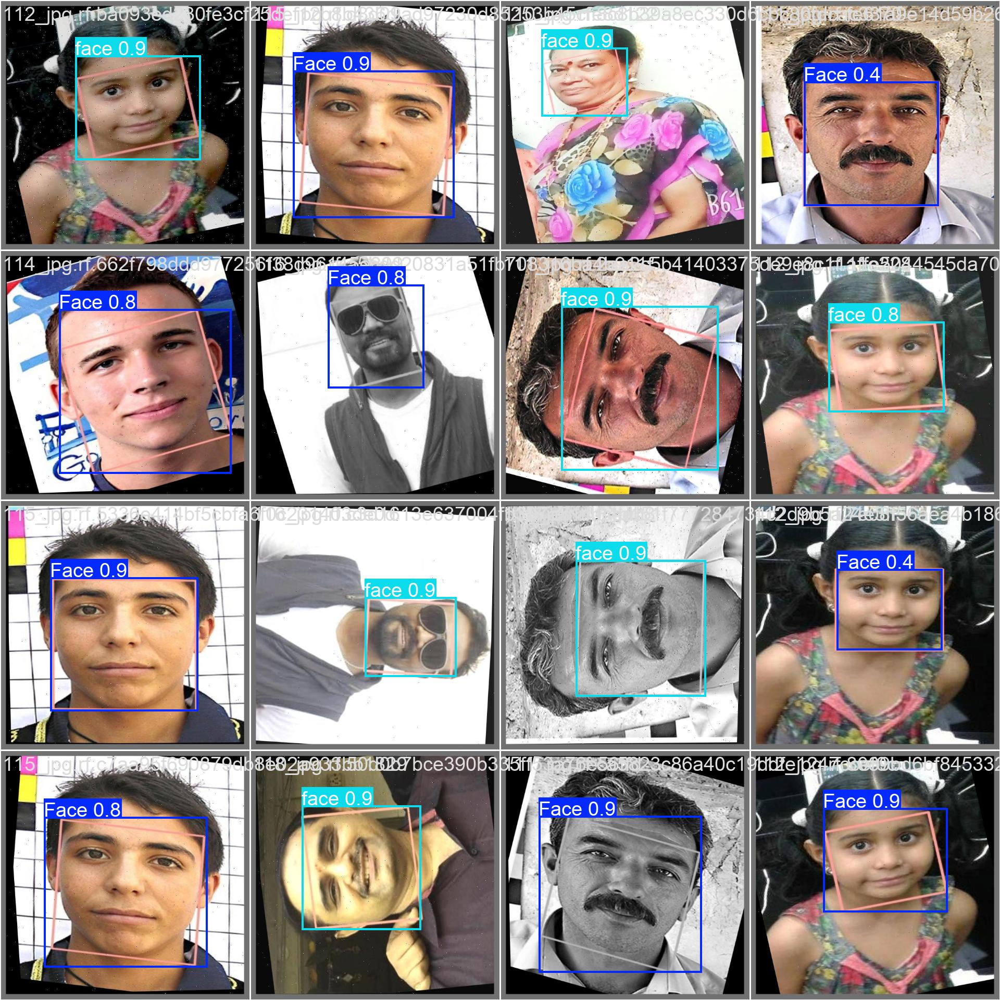

In [15]:
display(Image(filename=f"/kaggle/working/runs/detect/train2/val_batch1_pred.jpg", width=1000))

In [16]:
!yolo task=detect mode=predict model=/kaggle/working/runs/detect/train2/weights/best.pt imgsz=640 conf=0.5 \
source=/kaggle/working/face-detection-1/test/images

Ultralytics 8.3.24 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11s summary (fused): 238 layers, 9,413,574 parameters, 0 gradients, 21.3 GFLOPs

image 1/1513 /kaggle/working/face-detection-1/test/images/0_10725_jpg.rf.2211d1905defbdf8df9fe13f2191bc86.jpg: 640x640 4 Faces, 12.5ms
image 2/1513 /kaggle/working/face-detection-1/test/images/0_10725_jpg.rf.a2a7ce9d20e47c441ed87e73b35741a4.jpg: 640x640 4 Faces, 9.4ms
image 3/1513 /kaggle/working/face-detection-1/test/images/101_jpg.rf.13a210b8f1b51dc497bb936285ae72b4.jpg: 640x640 1 Face, 9.0ms
image 4/1513 /kaggle/working/face-detection-1/test/images/101_jpg.rf.4b93ceef452f206105e769dd650cd6b9.jpg: 640x640 1 Face, 9.0ms
image 5/1513 /kaggle/working/face-detection-1/test/images/101_jpg.rf.4f1bac551eface241ef0d8b8de2c84b9.jpg: 640x640 1 face, 9.1ms
image 6/1513 /kaggle/working/face-detection-1/test/images/101_jpg.rf.cb35b5f23de677941f6acb4b329836ab.jpg: 640x640 1 face, 9.0ms
image 7/1513 /kaggle/working/face-detectio

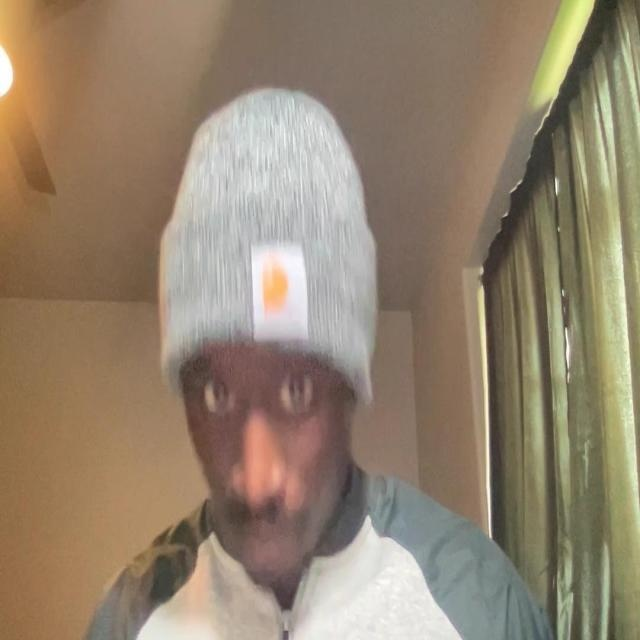

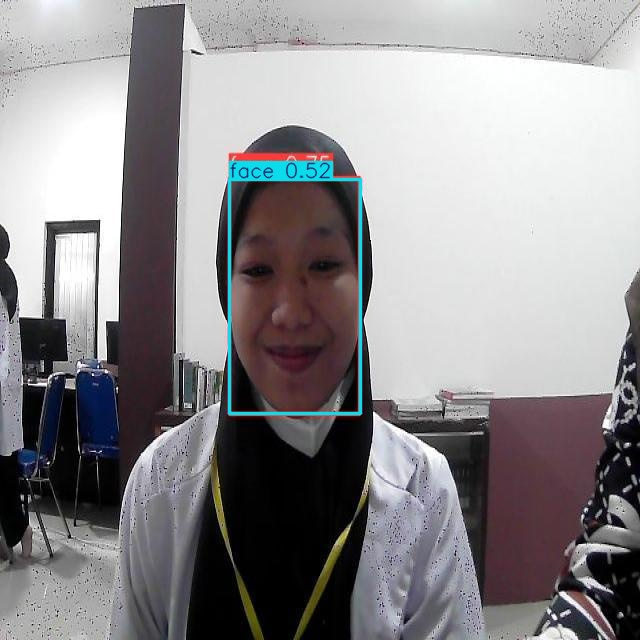

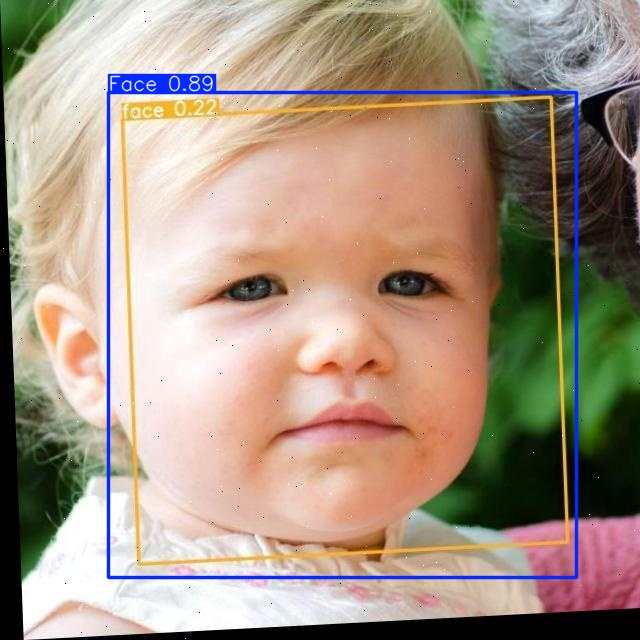

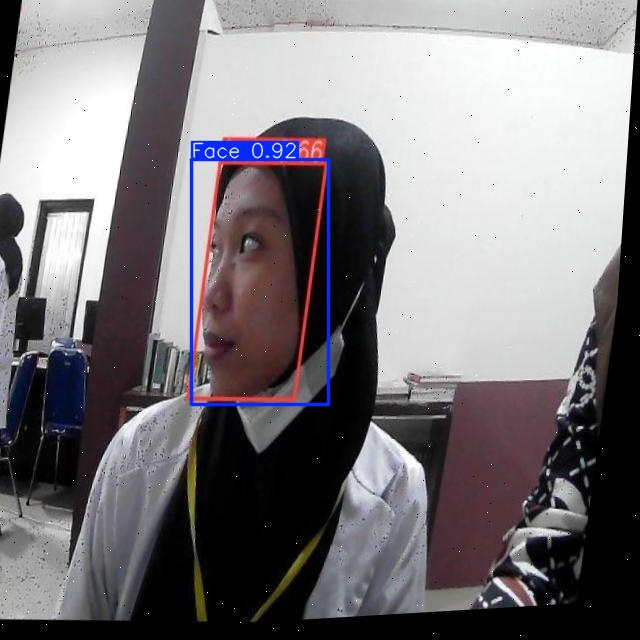

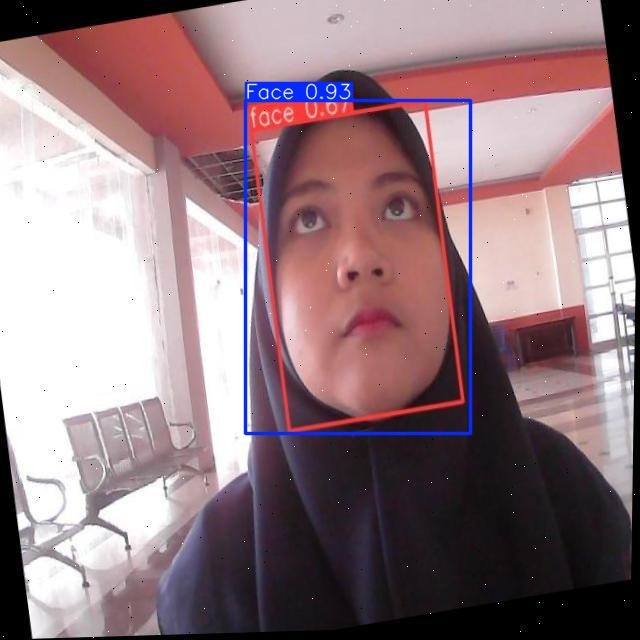

...

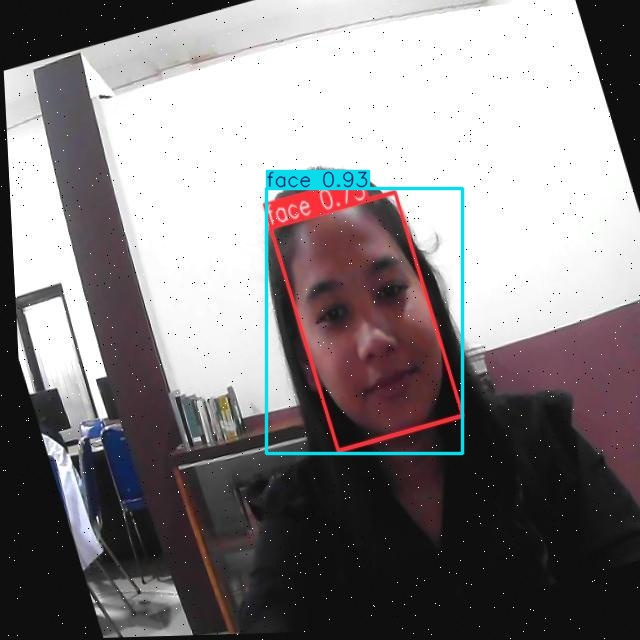

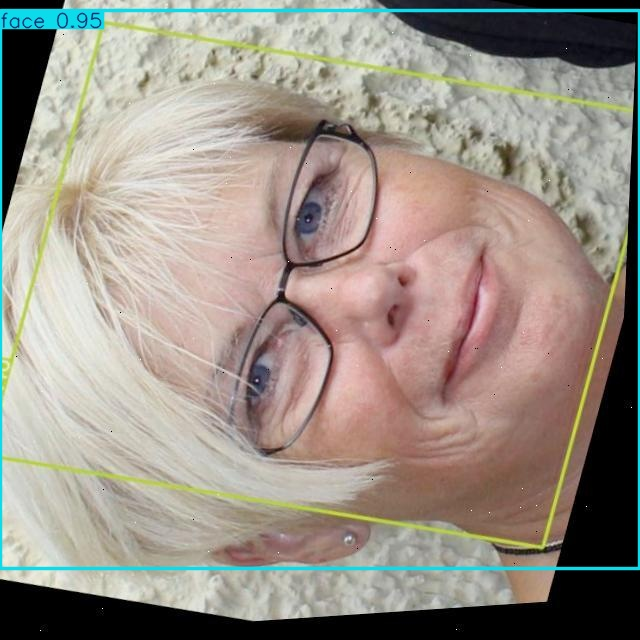

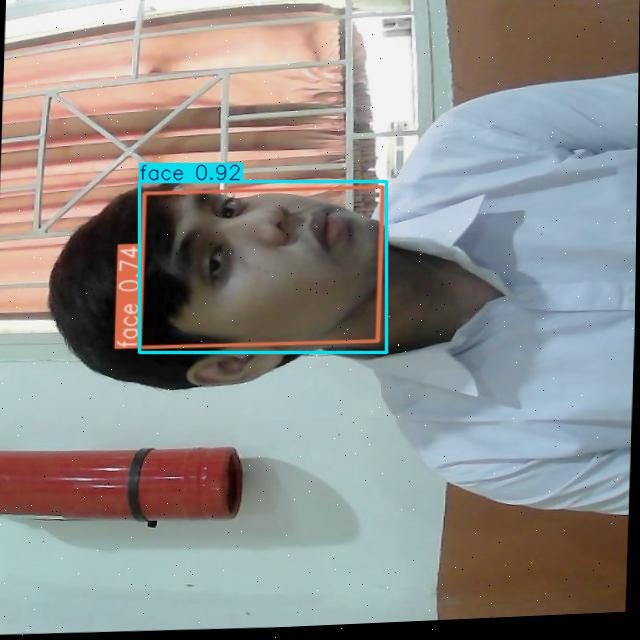

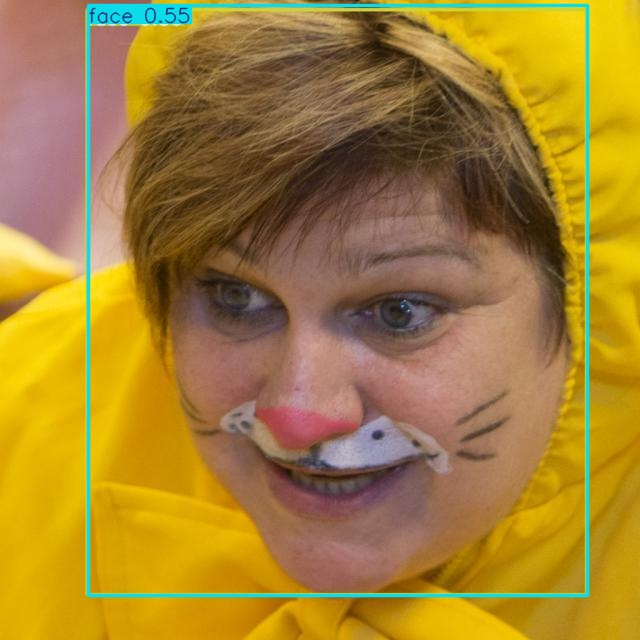

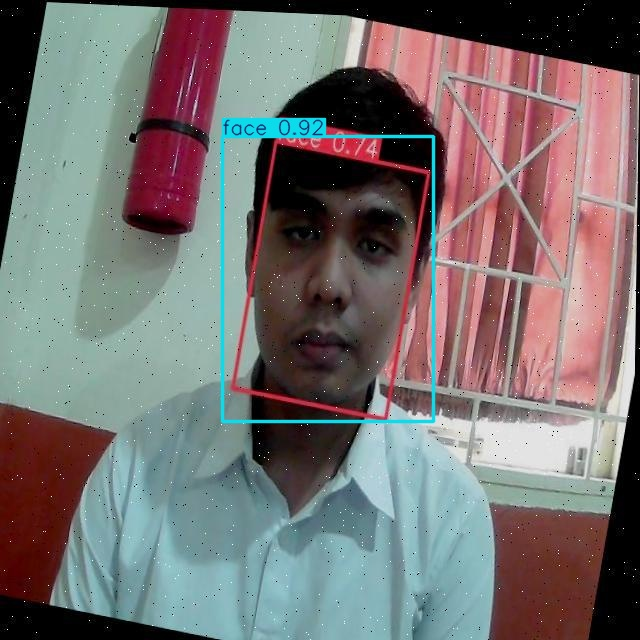

In [17]:
import glob
i=0
for image_name in glob.glob("/kaggle/working/runs/detect/predict2/*.jpg"):
    if i % 20 == 0 :
        print("\n")
        display(Image(filename=image_name))
    i+=1